In [1]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
import numpy as np
from glob import glob

In [2]:
#resize all the images
IMAGE_SIZE = [224,224]

train_path = 'C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\train'
valid_path = 'C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\val'

In [3]:
#import the resnet library and add preprocessing layer to the front of resnet
# here we will be using imagenet weights

resnet = ResNet50(input_shape = IMAGE_SIZE + [3], weights ='imagenet', include_top = False)

In [4]:
#dont train existing weights of resnet, because they are already optimized!

for layer in resnet.layers:
    layer.trainable = False

In [5]:
# getting number of output classes using number of folders

folders = glob('C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\train\\*')

In [6]:
folders

['C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\train\\diseased cotton leaf',
 'C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\train\\diseased cotton plant',
 'C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\train\\fresh cotton leaf',
 'C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\train\\fresh cotton plant']

In [7]:
#adding our layer (other than resnet's included ones), we can add more than one if required, here just one layer 
#flattening so we can add the last layer/layers based on our requirement

x = Flatten()(resnet.output)

In [8]:
# adding the final layer, our layer, at the end of resnet's layers
prediction = Dense(len(folders), activation='softmax')(x)

#create model object
model = Model(inputs = resnet.input, outputs=prediction)

In [9]:
#view the structure of our model
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

                                                                                                  
 conv2_block3_1_conv (Conv2  (None, 56, 56, 64)           16448     ['conv2_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv2_block3_1_bn (BatchNo  (None, 56, 56, 64)           256       ['conv2_block3_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block3_1_relu (Activ  (None, 56, 56, 64)           0         ['conv2_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv2_blo

 ation)                                                                                           
                                                                                                  
 conv3_block2_3_conv (Conv2  (None, 28, 28, 512)          66048     ['conv3_block2_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block2_3_bn (BatchNo  (None, 28, 28, 512)          2048      ['conv3_block2_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block2_add (Add)      (None, 28, 28, 512)          0         ['conv3_block1_out[0][0]',    
                                                                     'conv3_block2_3_bn[0][0]']   
          

 conv4_block1_2_conv (Conv2  (None, 14, 14, 256)          590080    ['conv4_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block1_2_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block1_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_2_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block1_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_0_conv (Conv2  (None, 14, 14, 1024)         525312    ['conv3_block4_out[0][0]']    
 D)       

                                                                                                  
 conv4_block3_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block3_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv4_block4_1_conv (Conv2  (None, 14, 14, 256)          262400    ['conv4_block3_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv4_block4_1_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block4_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block6_3_bn (BatchNo  (None, 14, 14, 1024)         4096      ['conv4_block6_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block6_add (Add)      (None, 14, 14, 1024)         0         ['conv4_block5_out[0][0]',    
                                                                     'conv4_block6_3_bn[0][0]']   
                                                                                                  
 conv4_block6_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block6_add[0][0]']    
 on)                                                                                              
          

 conv5_block3_1_relu (Activ  (None, 7, 7, 512)            0         ['conv5_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv5_block3_2_conv (Conv2  (None, 7, 7, 512)            2359808   ['conv5_block3_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block3_2_bn (BatchNo  (None, 7, 7, 512)            2048      ['conv5_block3_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block3_2_relu (Activ  (None, 7, 7, 512)            0         ['conv5_block3_2_bn[0][0]']   
 ation)   

In [10]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [19]:
#Data augmentation using ImageDataGenerator - done only for train images, not for test images

train_datagen = ImageDataGenerator(rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True)

val_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

In [12]:
#make sure to provide same target size as we initialized the image size

training_set = train_datagen.flow_from_directory('C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\train',
                                                target_size = (224,224),
                                                batch_size = 32,
                                                class_mode = 'categorical')

Found 1951 images belonging to 4 classes.


In [13]:
val_set = val_datagen.flow_from_directory('C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\val',
                                           target_size = (224,224),
                                           batch_size = 32,
                                           class_mode = 'categorical')

Found 324 images belonging to 4 classes.


In [20]:
test_set = test_datagen.flow_from_directory('C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\test',
                                           target_size = (224,224),
                                           batch_size = 32,
                                           class_mode = 'categorical')

Found 18 images belonging to 4 classes.


In [14]:
#fit the model

r = model.fit(training_set,
              validation_data = val_set,
              epochs = 5,
              steps_per_epoch = len(training_set),
              validation_steps = len(val_set))

Epoch 1/5


61/61 [==============================] - 178s 3s/step - loss: 2.8262 - accuracy: 0.4495 - val_loss: 1.1323 - val_accuracy: 0.5247
Epoch 2/5
61/61 [==============================] - 171s 3s/step - loss: 1.0418 - accuracy: 0.5874 - val_loss: 0.8869 - val_accuracy: 0.6327
Epoch 3/5
61/61 [==============================] - 168s 3s/step - loss: 1.0044 - accuracy: 0.6033 - val_loss: 0.9391 - val_accuracy: 0.6019
Epoch 4/5
61/61 [==============================] - 173s 3s/step - loss: 0.8282 - accuracy: 0.6632 - val_loss: 1.0841 - val_accuracy: 0.6111
Epoch 5/5
61/61 [==============================] - 182s 3s/step - loss: 0.8742 - accuracy: 0.6622 - val_loss: 0.7835 - val_accuracy: 0.6821


In [15]:
import matplotlib.pyplot as plt

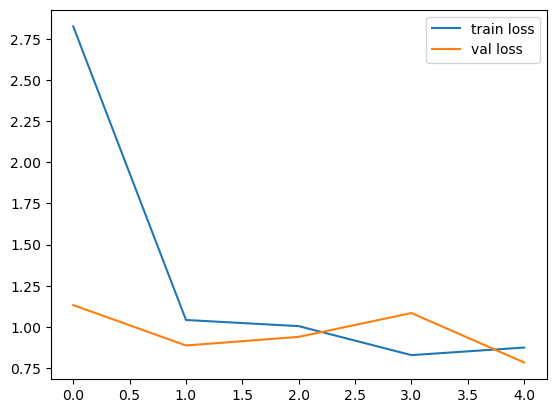

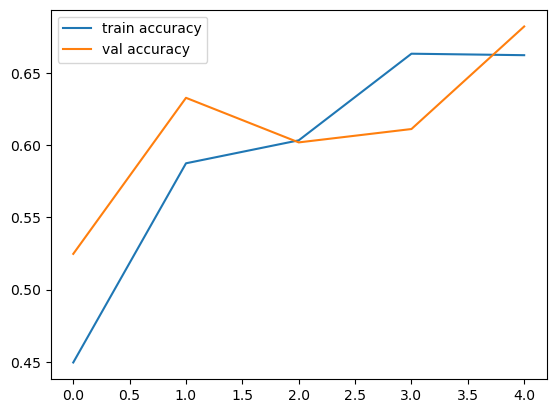

In [16]:
#plot the loss
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.show()

#plot the accuracy
plt.plot(r.history['accuracy'], label='train accuracy')
plt.plot(r.history['val_accuracy'], label='val accuracy')
plt.legend()
plt.show()

In [21]:
model.evaluate(test_set)

1/1 [==============================] - 4s 4s/step - loss: 0.7378 - accuracy: 0.7222


[0.7378194332122803, 0.7222222089767456]

In [44]:
y_pred = model.predict(test_set)

1/1 [==============================] - 6s 6s/step


In [45]:
y_pred

array([[2.6547381e-01, 1.6137849e-01, 1.0199250e-02, 5.6294841e-01],
       [6.1600123e-02, 5.7107425e-01, 1.8969576e-03, 3.6542863e-01],
       [9.6081263e-01, 4.3579885e-06, 7.7775691e-04, 3.8405318e-02],
       [9.7951874e-02, 5.4546225e-01, 7.6333530e-02, 2.8025234e-01],
       [1.6861533e-01, 1.3356498e-02, 6.6511256e-01, 1.5291563e-01],
       [9.9982905e-01, 9.8037304e-08, 6.4711785e-05, 1.0605998e-04],
       [7.8448676e-02, 1.2438828e-01, 6.2367130e-02, 7.3479599e-01],
       [8.8590018e-02, 9.4602576e-05, 9.1028070e-01, 1.0346924e-03],
       [1.4173898e-01, 4.8845811e-03, 8.2807589e-01, 2.5300629e-02],
       [5.8047365e-02, 1.3657972e-01, 5.7675231e-02, 7.4769771e-01],
       [6.3985988e-02, 7.4646527e-01, 1.5993009e-03, 1.8794943e-01],
       [9.1305010e-02, 3.0285481e-01, 7.5517409e-02, 5.3032273e-01],
       [7.4272764e-01, 7.4743114e-02, 3.3375524e-02, 1.4915378e-01],
       [4.0258501e-02, 1.7327616e-04, 8.8745320e-01, 7.2115004e-02],
       [3.8184008e-01, 1.8882060e-

In [46]:
import numpy as np
y_pred1 = np.argmax(y_pred, axis=1)

In [47]:
y_pred1

array([3, 1, 0, 1, 2, 0, 3, 2, 2, 3, 1, 3, 0, 2, 0, 2, 3, 3], dtype=int64)

In [1]:
#from sklearn.metrics import accuracy_score
#print(accuracy_score(test_set,y_pred1))

In [22]:
test_dir = 'C:\\Users\\User\\Desktop\\Datasets\\Cotton disease detection\\test'

In [23]:
import pathlib
test_dir = pathlib.Path(test_dir)
test_dir

WindowsPath('C:/Users/User/Desktop/Datasets/Cotton disease detection/test')

In [24]:
fresh_leaf = list(test_dir.glob('fresh cotton leaf/*'))
fresh_leaf[:5]

[WindowsPath('C:/Users/User/Desktop/Datasets/Cotton disease detection/test/fresh cotton leaf/d (341).jpg'),
 WindowsPath('C:/Users/User/Desktop/Datasets/Cotton disease detection/test/fresh cotton leaf/d (366).jpg'),
 WindowsPath('C:/Users/User/Desktop/Datasets/Cotton disease detection/test/fresh cotton leaf/d (378).jpg'),
 WindowsPath('C:/Users/User/Desktop/Datasets/Cotton disease detection/test/fresh cotton leaf/d (384).jpg'),
 WindowsPath('C:/Users/User/Desktop/Datasets/Cotton disease detection/test/fresh cotton leaf/d (396).jpg')]

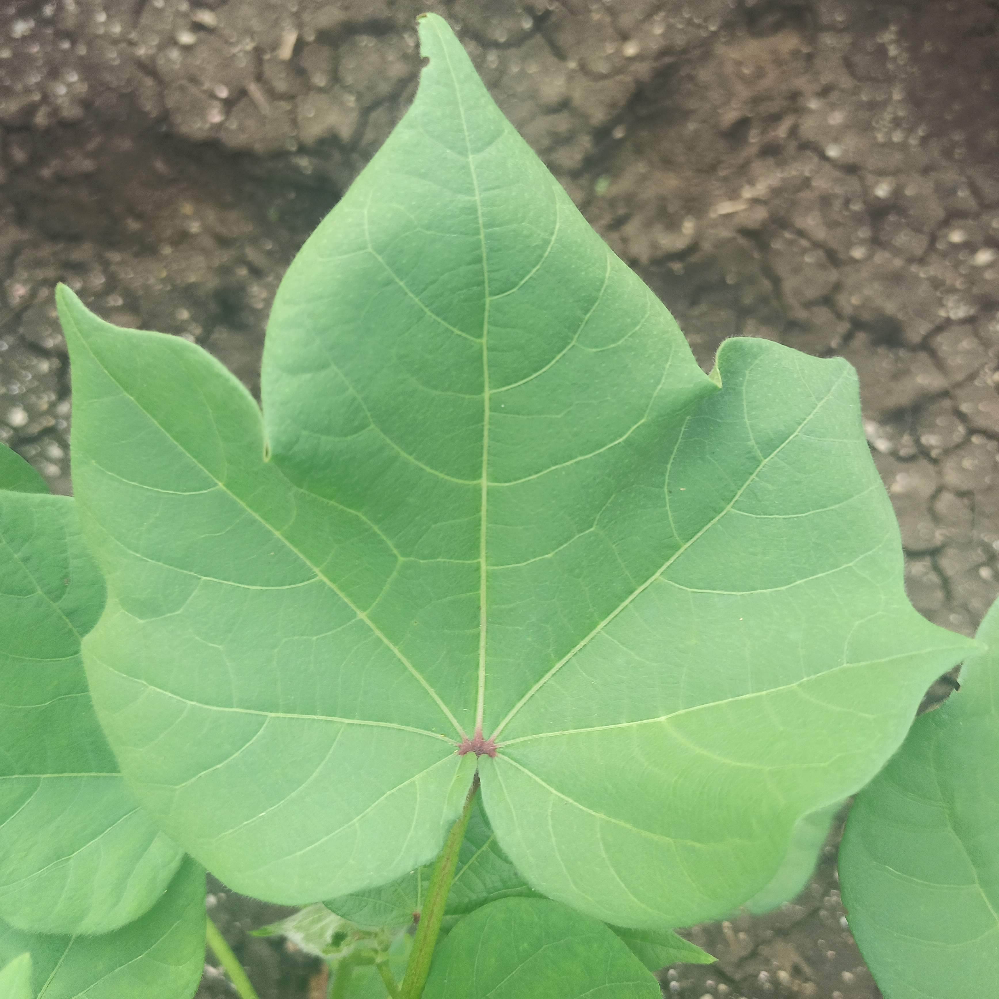

In [28]:
import PIL.Image as Image

Image.open(str(fresh_leaf[0]))

In [30]:
# from kaggle cotton disease prediction notebook
# https://www.kaggle.com/code/akashsdevbanshi/crop-disease-identification-using-cnn

import tensorflow as tf

test = tf.keras.preprocessing.image.load_img('C:\\Users\\User\Desktop\\Datasets\\Cotton disease detection\\test\\diseased cotton leaf\\dis_leaf (124).jpg', target_size=(224,224))

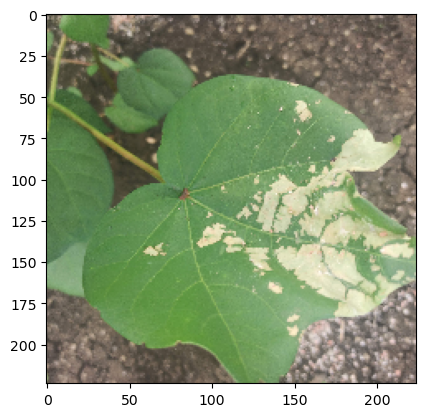

In [43]:
plt.imshow(test)

In [36]:
class_dict = training_set.class_indices
class_dict

{'diseased cotton leaf': 0,
 'diseased cotton plant': 1,
 'fresh cotton leaf': 2,
 'fresh cotton plant': 3}

In [40]:
class_name = []

for key,value in class_dict.items():
    class_name.append(key)

In [41]:
class_name

['diseased cotton leaf',
 'diseased cotton plant',
 'fresh cotton leaf',
 'fresh cotton plant']

In [42]:
class_name[np.argmax(model.predict(tf.expand_dims(test, 0))[0])]

1/1 [==============================] - 1s 1s/step


'diseased cotton leaf'

# END

In [50]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import load_img

In [51]:
# from krish cotton disease prediction github code 
# https://github.com/krishnaik06/Cotton-Disease-Prediction-Deep-Learning/blob/master/Transfer%20Learning%20Inception%20V3.ipynb

x = image.img_to_array(test)
x

array([[[ 86.,  84.,  71.],
        [ 83.,  85.,  72.],
        [ 77.,  75.,  62.],
        ...,
        [116.,  96.,  85.],
        [148., 128., 117.],
        [135., 115., 104.]],

       [[134., 130., 119.],
        [103., 100.,  83.],
        [ 99.,  97.,  84.],
        ...,
        [105.,  88.,  80.],
        [127., 107.,  96.],
        [127., 107.,  96.]],

       [[152., 143., 138.],
        [163., 153., 143.],
        [ 80.,  77.,  60.],
        ...,
        [112.,  95.,  87.],
        [127., 107.,  96.],
        [126., 107.,  93.]],

       ...,

       [[170., 183., 137.],
        [114., 116.,  94.],
        [ 88.,  79.,  74.],
        ...,
        [157., 139., 135.],
        [150., 135., 130.],
        [117., 106., 102.]],

       [[151., 157., 119.],
        [ 99.,  93.,  77.],
        [ 95.,  86.,  81.],
        ...,
        [133., 116., 109.],
        [116., 101.,  94.],
        [121., 110., 106.]],

       [[104.,  97.,  79.],
        [ 99.,  90.,  81.],
        [ 88.,  

In [52]:
x.shape

(224, 224, 3)

In [53]:
x = x/255
x

array([[[0.3372549 , 0.32941177, 0.2784314 ],
        [0.3254902 , 0.33333334, 0.28235295],
        [0.3019608 , 0.29411766, 0.24313726],
        ...,
        [0.45490196, 0.3764706 , 0.33333334],
        [0.5803922 , 0.5019608 , 0.45882353],
        [0.5294118 , 0.4509804 , 0.40784314]],

       [[0.5254902 , 0.50980395, 0.46666667],
        [0.40392157, 0.39215687, 0.3254902 ],
        [0.3882353 , 0.38039216, 0.32941177],
        ...,
        [0.4117647 , 0.34509805, 0.3137255 ],
        [0.49803922, 0.41960785, 0.3764706 ],
        [0.49803922, 0.41960785, 0.3764706 ]],

       [[0.59607846, 0.56078434, 0.5411765 ],
        [0.6392157 , 0.6       , 0.56078434],
        [0.3137255 , 0.3019608 , 0.23529412],
        ...,
        [0.4392157 , 0.37254903, 0.34117648],
        [0.49803922, 0.41960785, 0.3764706 ],
        [0.49411765, 0.41960785, 0.3647059 ]],

       ...,

       [[0.6666667 , 0.7176471 , 0.5372549 ],
        [0.44705883, 0.45490196, 0.36862746],
        [0.34509805, 0

In [54]:
x = np.expand_dims(x, axis=0)
img_data = preprocess_input(x)
img_data.shape

(1, 224, 224, 3)

In [55]:
model.predict(img_data)

1/1 [==============================] - 2s 2s/step


array([[9.8343796e-01, 4.0615001e-11, 1.6562004e-02, 3.2864084e-10]],
      dtype=float32)

In [56]:
a = np.argmax(model.predict(img_data), axis=1)
a

1/1 [==============================] - 0s 158ms/step


array([0], dtype=int64)